# Mapping of HLCA extension datasets to the HLCA core using scArches

Code reference paper: https://www.nature.com/articles/s41591-023-02327-2. Nature Medical, 2023.

Reference Github general repo: https://github.com/LungCellAtlas/HLCA

Reference Github code repo: https://github.com/LungCellAtlas/HLCA_reproducibility

### Import modules, set paths, load files:

In [33]:
# !pip install scanpy
# !pip install ipywidgets
import scanpy as sc
import anndata
import numpy as np
import pandas as pd
import os

from tqdm import tqdm

In [34]:
# !pip install scarches
# !pip install -U pandas==2.0

import scarches as sca

In [35]:
# https://github.com/huggingface/transformers/issues/29763
# pip install transformers==4.37.2
import torch

In [36]:
import warnings

warnings.simplefilter(action="ignore", category=FutureWarning)
warnings.simplefilter(action="ignore", category=UserWarning)

In [ ]:
sc.set_figure_params(dpi=120, figsize=(8, 8))

## Import the cell type information from the CSV file

In [38]:
# use the index_col parameter to set the unnamed column as index
# https://stackoverflow.com/questions/26098710/rename-unnamed-column-pandas-dataframe

df_adata_1 = pd.read_csv('/home/fanhuan/data/BioInfo/453k/expr_853-annotations.csv', index_col=0)
df_adata_1

,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,nCount_refAssay,nFeature_refAssay,predicted.ann_level_1.score,predicted.ann_level_1,predicted.ann_level_2.score,predicted.ann_level_2,...,predicted.ann_finest_level,mapping.score,hra_prediction,Organ_Level,Organ_ID,Annotation_Label_ID,CL_Label,clid,match_type,gene_expr
AAACATCGAAACATCGAAGACGGA,0,314.999996,296,0.000000,235.299998,225,0.490281,Endothelial,0.462529,Blood vessels,...,EC general capillary,0.503545,EC general capillary,Lung_v2_finest_level,UBERON:0002048,AZ:0000092,capillary endothelial cell,CL:0002144,skos:exactMatch,"[{""gene_id"": ""HGNC:10955"", ""gene_label"": ""SLCO..."
AAACATCGAAACATCGACACAGAA,0,402.999996,428,0.000000,304.432049,309,0.988470,Epithelial,0.988470,Alveolar epithelium,...,AT1,0.487594,AT1,Lung_v2_finest_level,UBERON:0002048,AZ:0000077,type I pneumocyte,CL:0002062,skos:exactMatch,"[{""gene_id"": ""HGNC:17941"", ""gene_label"": ""NTM""..."
AAACATCGAAACATCGATGCCTAA,0,125.999999,138,0.000000,103.799999,106,0.867516,Endothelial,0.866701,Blood vessels,...,EC general capillary,0.824496,EC general capillary,Lung_v2_finest_level,UBERON:0002048,AZ:0000092,capillary endothelial cell,CL:0002144,skos:exactMatch,"[{""gene_id"": ""HGNC:10955"", ""gene_label"": ""SLCO..."
AAACATCGAAACATCGGCGAGTAA,0,68.000000,67,0.000000,45.630952,50,0.984598,Endothelial,0.983341,Blood vessels,...,EC general capillary,0.669978,EC general capillary,Lung_v2_finest_level,UBERON:0002048,AZ:0000092,capillary endothelial cell,CL:0002144,skos:exactMatch,"[{""gene_id"": ""HGNC:10955"", ""gene_label"": ""SLCO..."
AAACATCGAAACATCGTGAAGAGA,0,160.999999,135,0.000000,108.300000,106,0.510922,Epithelial,0.308978,Airway epithelium,...,Basal resting,0.295210,Basal resting,Lung_v2_finest_level,UBERON:0002048,AZ:0000081,respiratory basal cell:resting,CL:0002633,skos:narrowMatch,"[{""gene_id"": ""HGNC:6427"", ""gene_label"": ""KRT17..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTCACGCATTCACGCAGCTCGGTA,0,173.999997,140,0.000000,116.366666,102,0.945720,Endothelial,0.945720,Blood vessels,...,EC general capillary,0.813476,EC general capillary,Lung_v2_finest_level,UBERON:0002048,AZ:0000092,capillary endothelial cell,CL:0002144,skos:exactMatch,"[{""gene_id"": ""HGNC:10955"", ""gene_label"": ""SLCO..."
TTCACGCATTCACGCAGGTGCGAA,0,546.999992,454,0.182815,360.066663,335,1.000000,Epithelial,1.000000,Airway epithelium,...,Multiciliated (non-nasal),0.763037,Multiciliated (non-nasal),Lung_v2_finest_level,UBERON:0002048,AZ:0000109,multi-ciliated epithelial cell:non-nasal,CL:0005012,skos:narrowMatch,"[{""gene_id"": ""HGNC:25892"", ""gene_label"": ""AGBL..."
TTCACGCATTCACGCATAGGATGA,0,842.999987,589,0.000000,561.303568,469,0.930099,Epithelial,0.818188,Alveolar epithelium,...,AT2,0.573620,AT2,Lung_v2_finest_level,UBERON:0002048,AZ:0000078,type II pneumocyte,CL:0002063,skos:exactMatch,"[{""gene_id"": ""HGNC:10801"", ""gene_label"": ""SFTP..."
TTCACGCATTCACGCATGGAACAA,0,459.999988,381,0.000000,307.341118,298,0.978988,Endothelial,0.974221,Blood vessels,...,EC arterial,0.750103,EC arterial,Lung_v2_finest_level,UBERON:0002048,AZ:0000091,endothelial cell of artery,CL:1000413,skos:exactMatch,"[{""gene_id"": ""HGNC:6533"", ""gene_label"": ""LDB2""..."


In [39]:
# As suggested by Bruce, will use the column CL_Label as the cell type label info
print('The type number of the cells is:',len(df_adata_1['CL_Label'].value_counts()))

df_adata_1['CL_Label'].value_counts()

The type number of the cells is: 43


CL_Label
capillary endothelial cell                                 32071
type I pneumocyte                                          15371
effector memory CD8-positive, alpha-beta T cell            10904
alveolar type 1 fibroblast cell                             6694
type II pneumocyte                                          6288
multi-ciliated epithelial cell:non-nasal                    5543
ionocyte                                                    4523
CD4-positive helper T cell                                  3607
endothelial cell of artery                                  2248
lung pericyte                                               2050
endothelial cell of venule                                  1836
respiratory basal cell:resting                              1785
alveolar type 2 fibroblast cell                             1364
alveolar capillary type 2 endothelial cell                   995
smooth muscle cell                                           788
nasal mucosa gob

### Start concating the two DataFrames

In [40]:
path_input_data_1 = '/home/fanhuan/data/BioInfo/453k/expr_853.h5ad'

In [41]:
reference_adata_1 = sc.read(path_input_data_1)

In [42]:
reference_adata_1.shape

(100921, 60286)

In [43]:
reference_adata_1

AnnData object with n_obs × n_vars = 100921 × 60286
    var: 'hugo_symbol'
    layers: 'spliced', 'spliced_unspliced_sum', 'unspliced'

In [44]:
list_cells = reference_adata_1.obs.index.tolist()
list_cell_types = []

error_counts = 0
error_label = 'ERROR'

for i in tqdm(range(len(list_cells))):
    index_example = list_cells[i]
    try:
        cell_type_example = df_adata_1.loc[index_example, 'CL_Label']
        list_cell_types.append(cell_type_example)
    except:
        error_counts += 1
        list_cell_types.append(error_label)

print('Error count is:', error_counts)
# list_cell_types
print('Error percentage is:', error_counts*100/len(list_cells),'%')

reference_adata_1.obs["CL_label"] = list_cell_types

100%|████████████████████████████████████████████████████████████████████████████████████████| 100921/100921 [00:00<00:00, 182999.24it/s]

Error count is: 0
Error percentage is: 0.0 %


In [45]:
reference_adata_1.obs.head(10)

,CL_label
AAACATCGAAACATCGAAGACGGA,capillary endothelial cell
AAACATCGAAACATCGACACAGAA,type I pneumocyte
AAACATCGAAACATCGATGCCTAA,capillary endothelial cell
AAACATCGAAACATCGGCGAGTAA,capillary endothelial cell
AAACATCGAAACATCGTGAAGAGA,respiratory basal cell:resting
AAACATCGAAACATCGTGGCTTCA,type I pneumocyte
AAACATCGAACAACCAAAACATCG,"effector memory CD8-positive, alpha-beta T cell"
AAACATCGAACAACCAAACCGAGA,alveolar type 1 fibroblast cell
AAACATCGAACAACCAAAGAGATC,capillary endothelial cell
AAACATCGAACAACCAACACAGAA,multi-ciliated epithelial cell:non-nasal


In [46]:
print(np.sum(reference_adata_1.X,axis=0))
print(np.sum(reference_adata_1.X,axis=1))

[[ 97.17   5.   107.   315.18 104.67 456.17 613.58 ...  12.83   0.
  151.25  13.67   7.25   0.    22.  ]]
[[ 56.37]
 [ 40.42]
 [ 12.95]
 [ 19.39]
 [ 22.7 ]
 [ 22.25]
 [  7.5 ]
 ...
 [ 14.07]
 [ 46.  ]
 [ 25.7 ]
 [ 97.5 ]
 [161.19]
 [ 72.22]
 [134.81]]


In [47]:
reference_adata_1.X = reference_adata_1.layers["spliced_unspliced_sum"]

In [48]:
reference_adata_1

AnnData object with n_obs × n_vars = 100921 × 60286
    obs: 'CL_label'
    var: 'hugo_symbol'
    layers: 'spliced', 'spliced_unspliced_sum', 'unspliced'

In [49]:
print(np.sum(reference_adata_1.X,axis=0))
print(np.sum(reference_adata_1.X,axis=1))

[[ 236.96  116.    924.19 1284.92 1666.06 2212.49 2831.65 ...   16.67
     0.    364.14   13.67 2796.44    0.     22.  ]]
[[315.]
 [403.]
 [126.]
 [ 68.]
 [161.]
 [133.]
 [ 44.]
 ...
 [ 83.]
 [268.]
 [174.]
 [547.]
 [843.]
 [460.]
 [819.]]


### Orginal - without normalization

In [50]:
sc.pp.neighbors(reference_adata_1)
sc.tl.umap(reference_adata_1)

         Falling back to preprocessing with `sc.pp.pca` and default params.


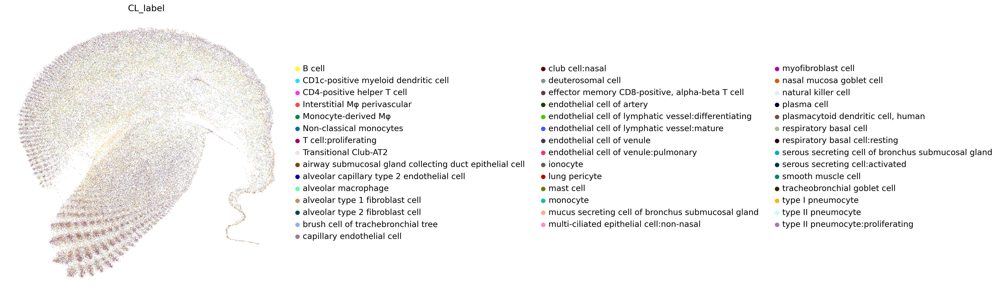

In [51]:
sc.pl.umap(reference_adata_1, color=['CL_label'], wspace=0.5, frameon=False)

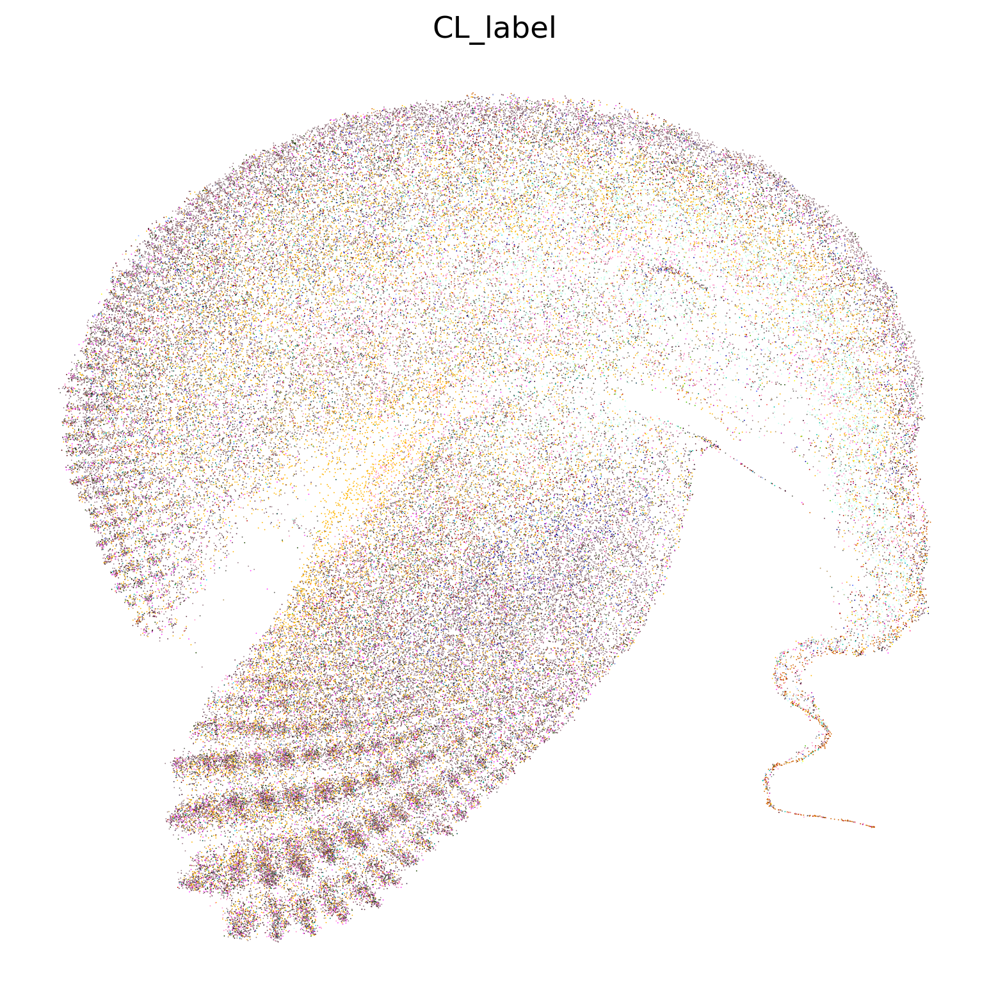

In [52]:
sc.pl.umap(reference_adata_1, color=['CL_label'], frameon=False, legend_loc = 'best')

### Log1p normalization

In [53]:
path_input_data_1 = '/home/fanhuan/data/BioInfo/453k/expr_853.h5ad'

reference_adata_1 = sc.read(path_input_data_1)

list_cells = reference_adata_1.obs.index.tolist()
list_cell_types = []

error_counts = 0
error_label = 'ERROR'

for i in tqdm(range(len(list_cells))):
    index_example = list_cells[i]
    try:
        cell_type_example = df_adata_1.loc[index_example, 'CL_Label']
        list_cell_types.append(cell_type_example)
    except:
        error_counts += 1
        list_cell_types.append(error_label)

print('Error count is:', error_counts)
# list_cell_types
print('Error percentage is:', error_counts*100/len(list_cells),'%')

reference_adata_1.obs["CL_label"] = list_cell_types

# choose layers

reference_adata_1.X = reference_adata_1.layers["spliced_unspliced_sum"]

100%|████████████████████████████████████████████████████████████████████████████████████████| 100921/100921 [00:00<00:00, 180010.77it/s]

Error count is: 0
Error percentage is: 0.0 %


In [54]:
sc.pp.log1p(reference_adata_1)

In [55]:
print(np.sum(reference_adata_1.X,axis=0))
print(np.sum(reference_adata_1.X,axis=1))

[[ 158.05   77.17  626.92  854.85 1149.62 1381.75 1807.65 ...   11.48
     0.    285.87   11.67 2076.65    0.     17.84]]
[[198.55]
 [266.34]
 [ 84.5 ]
 [ 41.73]
 [ 89.07]
 [ 89.04]
 [ 30.97]
 ...
 [ 54.36]
 [128.11]
 [ 94.64]
 [304.85]
 [414.93]
 [245.01]
 [425.13]]


In [56]:
sc.pp.neighbors(reference_adata_1)
sc.tl.umap(reference_adata_1)

         Falling back to preprocessing with `sc.pp.pca` and default params.


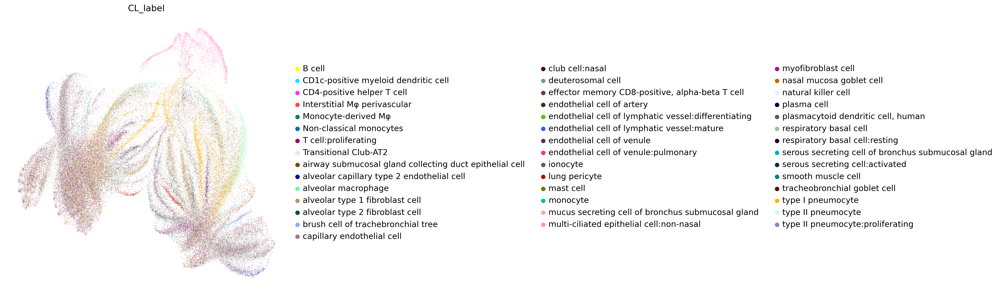

In [57]:
sc.pl.umap(reference_adata_1, color=['CL_label'], wspace=0.5, frameon=False)

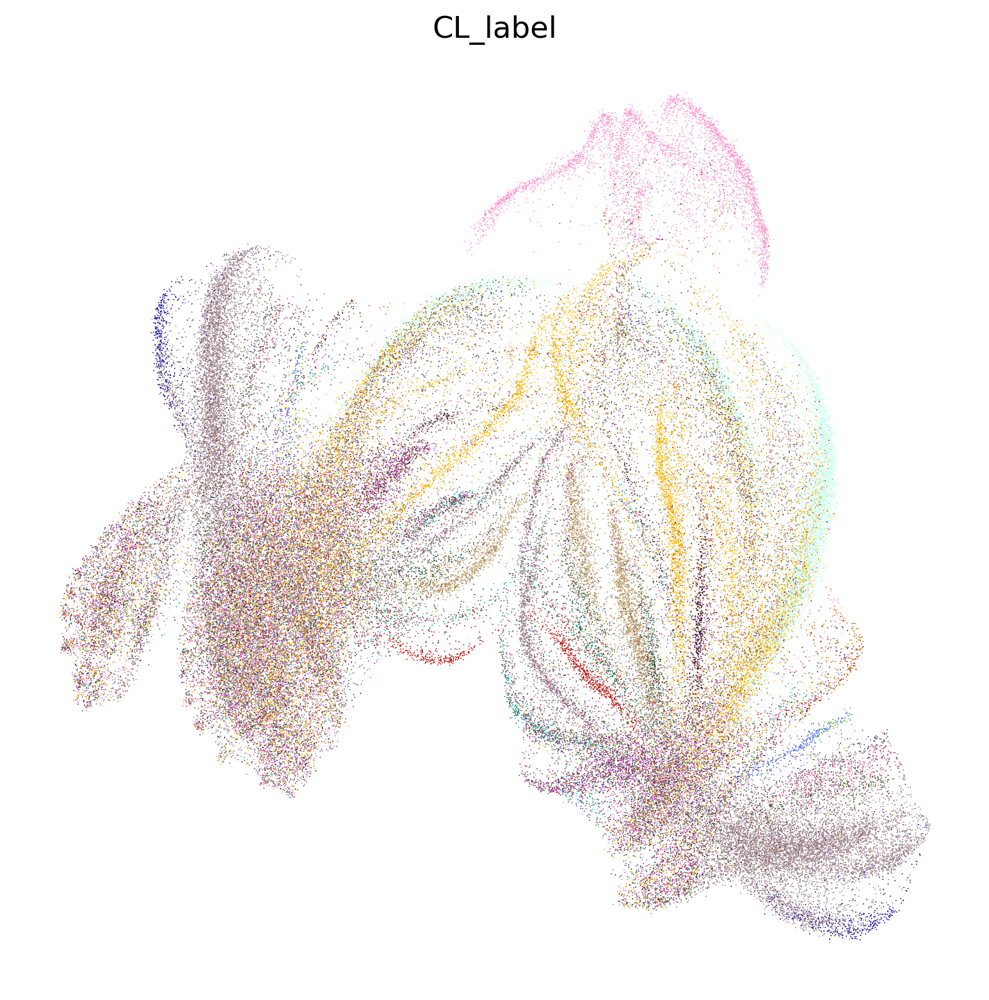

In [58]:
sc.pl.umap(reference_adata_1, color=['CL_label'], frameon=False, legend_loc = 'best')

### Normalize_total + Log1p normalization

In [59]:
path_input_data_1 = '/home/fanhuan/data/BioInfo/453k/expr_853.h5ad'

reference_adata_1 = sc.read(path_input_data_1)

list_cells = reference_adata_1.obs.index.tolist()
list_cell_types = []

error_counts = 0
error_label = 'ERROR'

for i in tqdm(range(len(list_cells))):
    index_example = list_cells[i]
    try:
        cell_type_example = df_adata_1.loc[index_example, 'CL_Label']
        list_cell_types.append(cell_type_example)
    except:
        error_counts += 1
        list_cell_types.append(error_label)

print('Error count is:', error_counts)
# list_cell_types
print('Error percentage is:', error_counts*100/len(list_cells),'%')

reference_adata_1.obs["CL_label"] = list_cell_types

# choose layers

reference_adata_1.X = reference_adata_1.layers["spliced_unspliced_sum"]

100%|████████████████████████████████████████████████████████████████████████████████████████| 100921/100921 [00:00<00:00, 181392.88it/s]

Error count is: 0
Error percentage is: 0.0 %


In [60]:
sc.pp.normalize_total(reference_adata_1)
sc.pp.log1p(reference_adata_1)

In [61]:
print(np.sum(reference_adata_1.X,axis=0))
print(np.sum(reference_adata_1.X,axis=1))

[[  83.01   34.81  324.86  482.17  587.85  858.58  983.08 ...    6.75
     0.    169.21    4.13 1064.05    0.     11.68]]
[[188.12]
 [209.99]
 [146.24]
 [ 99.97]
 [131.57]
 [150.4 ]
 [ 94.62]
 ...
 [119.36]
 [135.88]
 [132.74]
 [191.17]
 [187.36]
 [175.52]
 [194.77]]


In [62]:
sc.pp.neighbors(reference_adata_1)
sc.tl.umap(reference_adata_1)

         Falling back to preprocessing with `sc.pp.pca` and default params.


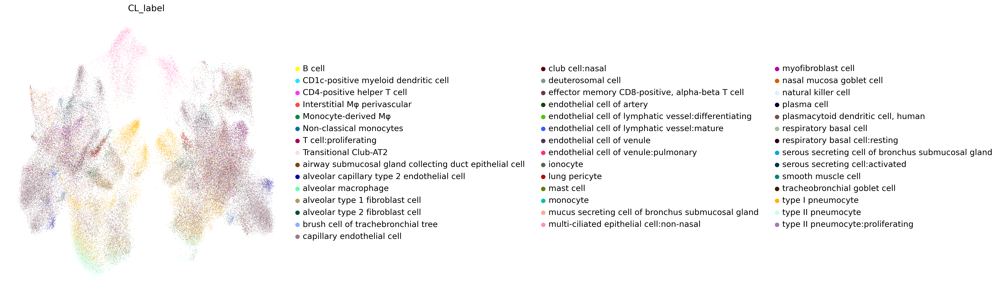

In [63]:
sc.pl.umap(reference_adata_1, color=['CL_label'], wspace=0.5, frameon=False)

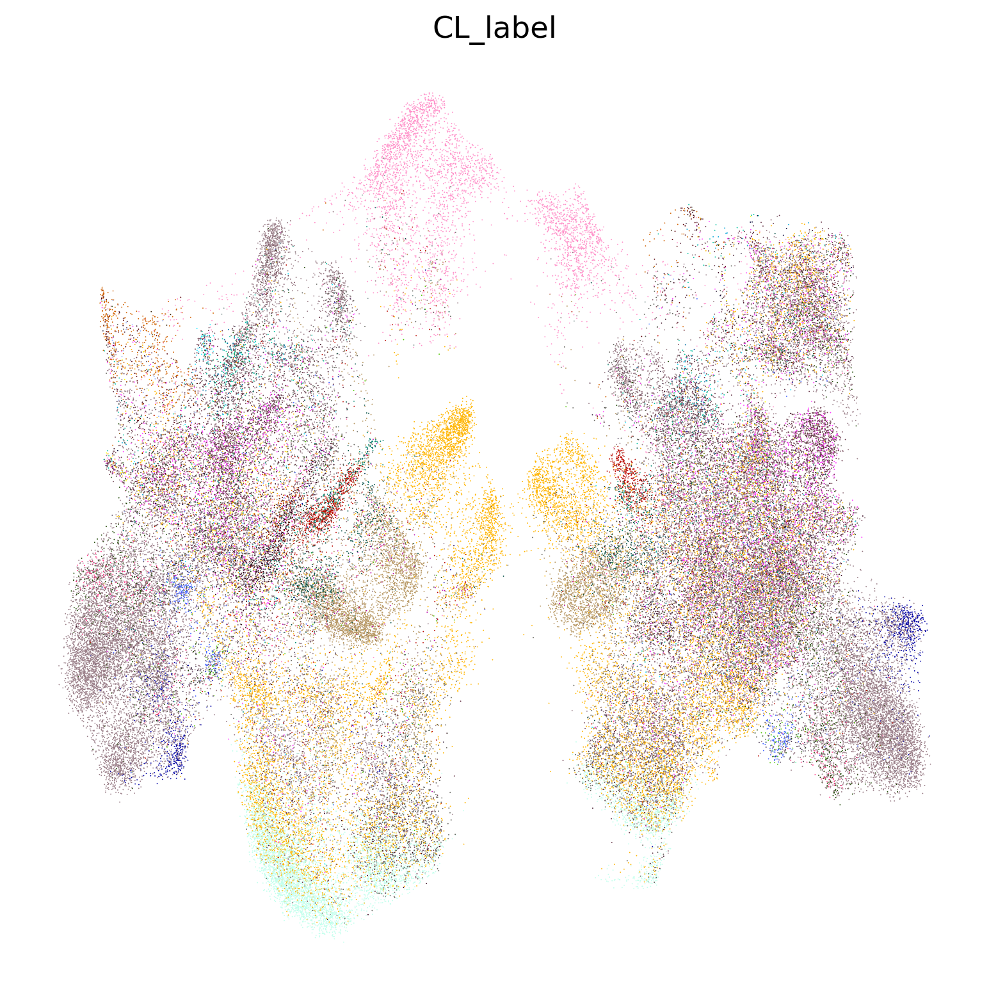

In [64]:
sc.pl.umap(reference_adata_1, color=['CL_label'], frameon=False, legend_loc = 'best')